# WEB SCRAPING-ASSIGNMENT3

In [19]:
#importing the required library
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
from selenium import webdriver
import pandas as pd
import numpy as np
import time
import urllib
import os

# Not to display warnings.

import warnings
warnings.filterwarnings('ignore')

In [20]:
def get_url(search_term,page_no=1):
    """Generate a URL for search Term with page number"""
    template = 'https://www.amazon.in/s?k={}&page={}&qid=1618507666&ref=sr_pg_{}'
    search_term = search_term.replace(' ','+')
    return template.format(search_term, page_no, page_no)

In [21]:
def search_item(search_term):
    """Main Function"""
       
    product = []
    Rating = []
    No_of_Ratings = []
    HREFF = []
    Price = []
    exchange_discount = []
    Expected_Delivery = []
    other_details = []
    

    for i in range(1,4):     #Starting up web-driver.
        driver = webdriver.Chrome()
        url = get_url(search_term, i)
        driver.get(url)
    
        for i in driver.find_elements_by_xpath("//h2/a"):
            HREFF.append(i.get_attribute('href')) #Getting href from the driver
        driver.close()
    
    for i in HREFF: #Using href scraping the required detail.
        driver = webdriver.Chrome()
        driver.get(i)
        driver.maximize_window()
    
        product.append(driver.find_element_by_xpath("//h1[@id = 'title']").text)#Scraping product details
        
        try: #Scraping Price details
            Price.append(driver.find_element_by_xpath("//span[@id = 'priceblock_dealprice']").text)
        except:
            try:
                Price.append(driver.find_element_by_xpath("//span[@id = 'priceblock_ourprice']").text)  
            except:
                Price.append("Out Of Stock")
            
        try:#Scraping Delivery details
            Expected_Delivery.append(driver.find_element_by_xpath("//div[@id = 'ddmDeliveryMessage']/b").text) 
        except:
            Expected_Delivery.append('-')
        try:#Scraping exchange details
            exchange_discount.append(driver.find_element_by_xpath("//div[@id = 'maxBuyBackDiscountSection']/span/span[@class = 'a-color-price']").text)
        except:
            exchange_discount.append('-')
         
        try:#Scraping Other product details details
            other_details.append(driver.find_element_by_xpath("//ul[@class = 'a-unordered-list a-vertical a-spacing-mini']").text) 
        except:
            other_details.append('-')
            
    
        driver.get(i+'#customerReviews')
       
        try:#Scraping ratings details
            Rating.append(driver.find_element_by_xpath("//span[@class = 'a-size-medium a-color-base']").text)
            No_of_Ratings.append(driver.find_element_by_xpath("//div[@data-hook = 'total-review-count']/span[@class = 'a-size-base a-color-secondary']").text)
        except:
            Rating.append('-')
            No_of_Ratings.append('-')    
    
        driver.close()
        
    brand = [i.split(' ')[:2]for i in product] #from Product details spliting the Brand
    brand = [brand[i][0]+' '+ brand[i][1] for i in range(len(brand))]
        
    Iteams = pd.DataFrame({'Brand_name': brand, #Creating DataFrame
                           'Product':product,
                           'Rating': Rating,
                           'No_of_Ratings': No_of_Ratings,
                           'Price': Price, 
                           'exchange_discount': exchange_discount, 
                           'Expected_Delivery' : Expected_Delivery, 
                           'URL':HREFF,
                           'other_details':other_details })
    
    Iteams.to_csv(f"{'Amazon searched '+search_term}.csv",index=False) #Creating CSV
    
    return Iteams    
            
            
            

In [24]:
search_item("Smart TV") #calling the Function.
pd.read_csv("Amazon searched Smart TV.csv") #opening the saved CSV file.

,Brand_name,Product,Rating,No_of_Ratings,Price,exchange_discount,Expected_Delivery,URL,other_details
0,AmazonBasics 127cm,AmazonBasics 127cm (50 inch) 4K Ultra HD Smart...,4 out of 5,"2,022 global ratings",Out Of Stock,"Up to 4,990.00 off","Tuesday, Jan 4, 8AM-6PM",https://www.amazon.in/gp/slredirect/picassoRed...,Resolution: 4K Ultra HD (3840 x 2160) | Refres...
1,AmazonBasics 109,AmazonBasics 109 cm (43 inches) Full HD Smart ...,4.1 out of 5,"1,984 global ratings",Out Of Stock,"Up to 4,990.00 off","Tuesday, Jan 4, 8AM-6PM",https://www.amazon.in/gp/slredirect/picassoRed...,Resolution: Full HD (1920x1080) | Refresh Rate...
2,Redmi 80,Redmi 80 cm (32 inches) HD Ready Smart LED TV ...,4.3 out of 5,"14,641 global ratings",Out Of Stock,"Up to 2,330.00 off","Tuesday, Jan 4, 7AM-9PM",https://www.amazon.in/Redmi-inches-Ready-L32M6...,Resolution: HD Ready (1366x768) | Refresh Rate...
3,OnePlus 108,OnePlus 108 cm (43 inches) Y Series Full HD LE...,4.2 out of 5,"29,280 global ratings",Out Of Stock,"Up to 2,330.00 off","Tuesday, Jan 4, 7AM-9PM",https://www.amazon.in/OnePlus-inches-Smart-And...,Resolution: Full HD (1920x1080) | Refresh Rate...
4,Redmi 108,Redmi 108 cm (43 inches) Full HD Smart LED TV ...,4.3 out of 5,"14,641 global ratings",Out Of Stock,"Up to 2,330.00 off","Tuesday, Jan 4, 7AM-9PM",https://www.amazon.in/Redmi-inches-Smart-L43M6...,Resolution : Full HD (1920x1080) resolution | ...
...,...,...,...,...,...,...,...,...,...
61,LG 139.7,LG 139.7 cm (55 inches) 4K Ultra HD Smart LED ...,4.3 out of 5,"1,752 global ratings",Out Of Stock,"Up to 2,330.00 off","Tuesday, Jan 4, 7AM-9PM",https://www.amazon.in/LG-139-7-inches-Ultra-55...,Resolution: 4K Ultra HD (3840x2160) | Refresh ...
62,Vu 139,Vu 139 cm (55 inches) 4K Ultra HD Smart Androi...,4.4 out of 5,"4,460 global ratings",Out Of Stock,"Up to 2,330.00 off","Tuesday, Jan 4, 7AM-9PM",https://www.amazon.in/inches-Ultra-Android-5-H...,Resolution: 4K Ultra HD (3840x2160) | Refresh ...
63,Mi 125.7,Mi 125.7 cm (50 Inches) 4K Ultra HD Android Sm...,4.3 out of 5,"19,646 global ratings",Out Of Stock,"Up to 2,330.00 off","Tuesday, Jan 4, 7AM-9PM",https://www.amazon.in/Mi-125-7-Inches-Ultra-An...,Resolution: 4K Ultra HD (3840x2160) | Refresh ...
64,AmazonBasics 109,AmazonBasics 109 cm (43 inches) Full HD Smart ...,4.1 out of 5,"1,984 global ratings",Out Of Stock,"Up to 4,990.00 off","Tuesday, Jan 4, 8AM-6PM",https://www.amazon.in/gp/slredirect/picassoRed...,Resolution: Full HD (1920x1080) | Refresh Rate...


In [25]:
def get_url(search_term): #Creating Function for generating URL with search term in images.google.com
    """Generate a URL for search Term"""
    template = 'https://www.google.com/search?q={}&source=lnms&tbm=isch&sa=X&ved=2ahUKEwip5oaS7YXwAhUFjeYKHQ71BwsQ_AUoAXoECAIQAw&biw=1536&bih=710&dpr=1.25'
    search_term = search_term.replace(' ','+')
    return template.format(search_term)

def search_image(search_term): #Creating function for scraping images.
    """Search images for given search term and saved in Directory"""

    driver = webdriver.Chrome()
    url = get_url(search_term)
    driver.get(url)
    driver.maximize_window()
    
    try: #Creating Directory.
        if not os.path.exists(search_term):
            os.makedirs(search_term)
    except OSError:
        print ('Error: Creating directory. ' +  search_term)
        
    driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")
    
    time.sleep(1)     
    img_source = []
        
    while True: #Loop for searching 100 images.
        for i in driver.find_elements_by_xpath('//div[@class="bRMDJf islir"]/img'):
            img_source.append(i.get_attribute('src'))
            driver.execute_script("window.scrollTo(0, document.body.scrollHeight);")
            time.sleep(2)
            IMG = [J for J in img_source if J] 
        if len(IMG) == 100:
            break
      
    for j in range(0,len(IMG)): #Saving the images
        exec(f"urllib.request.urlretrieve(img_source[j], './{search_term}/{search_term}_{j}.jpg')")
    driver.close()
    
    plt.figure(figsize =(20,70)) #Displaying the saved images
    for i in range(0,len(img_source)):
        file = os.listdir(f"{search_term}")[i]
        image_path = os.path.join(f"{search_term}",file)
        img = mpimg.imread(image_path)
        ax = plt.subplot(20,5,i+1)
        ax.title.set_text(file)
        image = plt.imshow(img)
    
    return print(f"{len(IMG)} Images of {search_term} saved at ",os.path.abspath(f"{search_term}"),"\n",image)


100 Images of fruits saved at  /Users/rakeshchandramaity/fruits 
 AxesImage(1103.59,630;192.414x159.882)


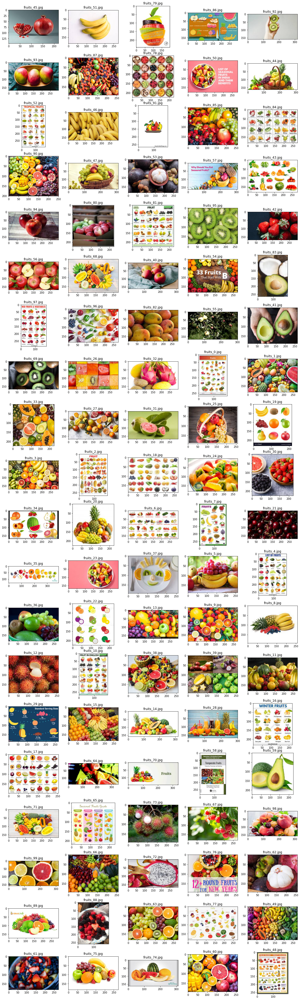

In [26]:
search_image('fruits')

100 Images of car saved at  /Users/rakeshchandramaity/car 
 AxesImage(1103.59,630;192.414x159.882)


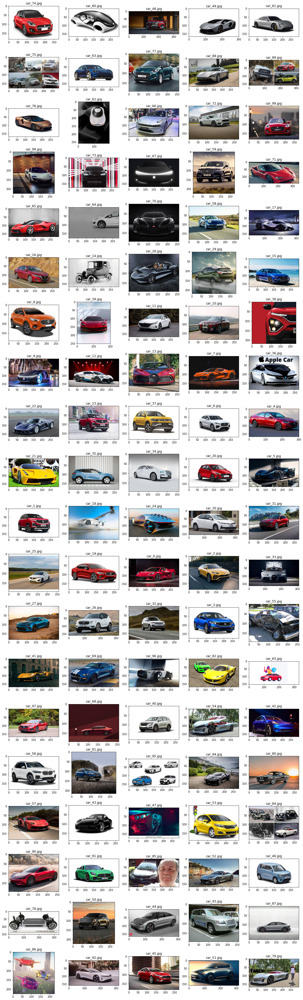

In [27]:
search_image('car')

100 Images of Meachine Learning saved at  /Users/rakeshchandramaity/Meachine Learning 
 AxesImage(1103.59,630;192.414x159.882)


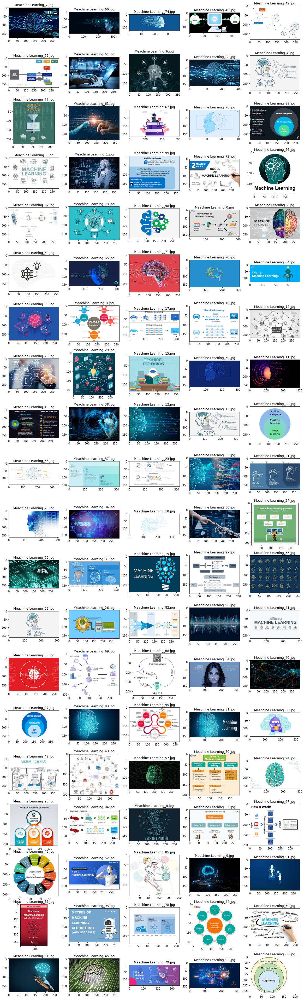

In [28]:
search_image('Meachine Learning')

In [32]:
def flipkart(search_term):
    """Generate a URL for search Term"""
    template = 'https://www.flipkart.com/search?q={}&otracker=search&otracker1=search&marketplace=FLIPKART&as-show=on&as=off'
    search_term = search_term.replace(' ','%20')
    return template.format(search_term)

def search_mobile(search_term):
    """Function helps to search first page from Flipkart.com"""
    
    Product_URL = []
    Brand_Name = []
    Smartphone_name = []
    Price = []
    color = []
    Display_Size = []
    Display_Resolution = []
    Processor = []
    Processor_Cores = [] 
    Internal_Storage = []
    RAM = []
    Primary_Camera = []
    Secondary_Camera = []
    Battery_Capacity = []
      
    
    driver = webdriver.Chrome()
    url = flipkart(search_term)
    driver.get(url)
    driver.maximize_window()
    
    #Scraping URL from the searched term
    for i in driver.find_elements_by_xpath("//div[@class='_2kHMtA']/a[@class = '_1fQZEK']"):
        Product_URL.append(i.get_attribute('href'))
        
    driver.close()
    
    
    for i in Product_URL:
        driver = webdriver.Chrome()
        driver.get(i)
        driver.maximize_window()
        
        #Scraping Smartphone_name from the searched term
        Smartphone_name.append(driver.find_element_by_xpath("//h1[@class = 'yhB1nd']/span[@class = 'B_NuCI']").text)
        
        #Scraping Price from the searched term
        Price.append(driver.find_element_by_xpath("//div[@class = '_25b18c']/div[@class = '_30jeq3 _16Jk6d']").text)
    
        btn = driver.find_element_by_xpath("//button[@class = '_2KpZ6l _1FH0tX']")
        btn.click()
        time.sleep(2)
        
        dummy = [] #creating two dummy list to store all the details of the Product
        for i in driver.find_elements_by_xpath("//div/div[@class = '_1UhVsV']"):
            dummy.append(i.text)
        
        driver.close()
        
        Dummy = [i.split('\n') for i in dummy]
        Dummy= Dummy[0]
        Dummy.remove('General')
        
        #spliting the required details from Dummy
        for i in range(0,len(Dummy)):
            if Dummy[i] == 'Color':
                color.append(Dummy[i+1])    
            if Dummy[i] == 'Display Size':
                Display_Size.append(Dummy[i+1])    
            if Dummy[i] == 'Resolution':
                Display_Resolution.append(Dummy[i+1])    
            if Dummy[i] == 'Processor Type':
                Processor.append(Dummy[i+1])      
            if Dummy[i] == 'Processor Core':
                Processor_Cores.append(Dummy[i+1])   
            if Dummy[i] == 'Internal Storage':
                Internal_Storage.append(Dummy[i+1])
            if Dummy[i] == 'RAM':
                RAM.append(Dummy[i+1])
            if Dummy[i] == 'Primary Camera':
                if Dummy[i+1] != 'Call Features':
                    Primary_Camera.append(Dummy[i+1])
            if Dummy[i] == 'Secondary Camera':
                Secondary_Camera.append(Dummy[i+1])
            if Dummy[i] == 'Battery Capacity':
                Battery_Capacity.append(Dummy[i+1])
        
    
    Brand_Name = [i.split(' ')[0] for i in Smartphone_name] #Spliting Brand details from smart Smartphone_name
    
    #Creating DataFrame.
    Iteams = pd.DataFrame({"Brand_Name" :Brand_Name,
                           "Smartphone_name" :Smartphone_name,
                           "Price" :Price,
                           "Color" :color,
                           "Display_Size" :Display_Size,
                           "Display_Resolution" :Display_Resolution,
                           "Processor" :Processor,
                           "Processor_Cores" :Processor_Cores, 
                           "Internal_Storage" :Internal_Storage,
                           "RAM" :RAM,
                           "Primary_Camera" :Primary_Camera,
                           "Secondary_Camera" :Secondary_Camera,
                           "Battery_Capacity" :Battery_Capacity,
                           "Product_URL":Product_URL,})
    
    #saving the dataframe in csv
    Iteams.to_csv(f"{'FlipKart searched '+search_term}.csv",index=False)
    
    return Iteams    

In [52]:
search_mobile("Nokia Smart Phoen")

ValueError: All arrays must be of the same length

In [36]:
pd.read_csv('FlipKart searched nokia.csv').head()

,Brand_Name,Smartphone_name,Price,Color,Display_Size,Display_Resolution,Processor,Processor_Cores,Internal_Storage,RAM,Primary_Camera,Secondary_Camera,Battery_Capacity,Product_URL


In [39]:
def GoogleMaps(search_city):
    """Generate a URL for search Term"""
    template = 'https://www.google.com/maps/place/{}/'
    search_city = search_city.replace(' ','+')
    return template.format(search_city)

def search_coordinates(search_city): #Creating Function for searching the location and returns the coordinates.
    driver = webdriver.Chrome()
    url = GoogleMaps(search_city)
    driver.get(url)
    driver.maximize_window()
    button = driver.find_element_by_xpath("//button[@aria-label = 'Search']")
    button.click()
    time.sleep(5)

    coordinates = [driver.current_url]
    driver.close()
    coordinates = [i.split('@')[1] for i in coordinates]
    coordinates = [i.split(',')[:2] for i in coordinates]
    coordinates = coordinates[0]
    
    return print(f"The geospatial coordinates of {search_city} \n Lattitude:", coordinates[0], "\n Longitude:", coordinates[1])

In [41]:
search_coordinates("Kolkata")

The geospatial coordinates of Kolkata 
 Lattitude: 22.6763858 
 Longitude: 88.049527


In [42]:
search_coordinates("Chicago")

The geospatial coordinates of Chicago 
 Lattitude: 41.8339042 
 Longitude: -88.0121563


In [43]:
search_coordinates("Argori")

The geospatial coordinates of Argori 
 Lattitude: 22.5877846 
 Longitude: 88.2149903


In [44]:
search_coordinates("New Delhi")

The geospatial coordinates of New Delhi 
 Lattitude: 28.527582 
 Longitude: 77.0688974


In [45]:
search_coordinates("Lahore")

The geospatial coordinates of Lahore 
 Lattitude: 31.4832209 
 Longitude: 74.0541912


In [48]:
driver = webdriver.Chrome()
url = 'https://trak.in/india-startup-funding-investment-2015/'
driver.get(url)
driver.maximize_window()
time.sleep(5)
#searching the Funding Details from trak.in

SRNO = []
Date = []
strtup = []
industry = []
Sub_Vertical = []
city = []
Investors = []
Investment_type = []
amount = []

for j in 48, 49,50: #Collecting all the funding details of july, aug sep of 2020 which is in indexes of 48,49,50
    dropdown = driver.find_element_by_xpath(f"//div[@class = 'dataTables_length']//select[@name = 'tablepress-{j}_length']")
    dropdown.send_keys("100")
    for i in driver.find_elements_by_xpath(f"//table[@id = 'tablepress-{j}']//td[@class = 'column-1']"):
        SRNO.append(i.text)

    for i in driver.find_elements_by_xpath(f"//table[@id = 'tablepress-{j}']//td[@class = 'column-2']"):
        Date.append(i.text)        
  
    for i in driver.find_elements_by_xpath(f"//table[@id = 'tablepress-{j}']//td[@class = 'column-3']"):
        strtup.append(i.text)

    for i in driver.find_elements_by_xpath(f"//table[@id = 'tablepress-{j}']//td[@class = 'column-4']"):
        industry.append(i.text)    
    
    for i in driver.find_elements_by_xpath(f"//table[@id = 'tablepress-{j}']//td[@class = 'column-5']"):
        Sub_Vertical.append(i.text)

    for i in driver.find_elements_by_xpath(f"//table[@id = 'tablepress-{j}']//td[@class = 'column-6']"):
        city.append(i.text)

    for i in driver.find_elements_by_xpath(f"//table[@id = 'tablepress-{j}']//td[@class = 'column-7']"):
        Investors.append(i.text)    

    for i in driver.find_elements_by_xpath(f"//table[@id = 'tablepress-{j}']//td[@class = 'column-8']"):
        Investment_type.append(i.text)

    for i in driver.find_elements_by_xpath(f"//table[@id = 'tablepress-{j}']//td[@class = 'column-9']"):
        amount.append(i.text)
    
driver.close()
    
#Creating DataFrame from the collected details

Funding_Deals=pd.DataFrame({"SRNO":SRNO,
                            "Date":Date,
                            "Start_Up":strtup,
                            "Industry":industry,
                            "Sub_Vertical":Sub_Vertical,
                            "City":city,
                            "Investors":Investors,
                            "Investment_type":Investment_type,
                            "Amount":amount})

Funding_Deals

,SRNO,Date,Start_Up,Industry,Sub_Vertical,City,Investors,Investment_type,Amount
0,1,15/07/2020,Flipkart,E-commerce,E-commerce,Bangalore,Walmart Inc,M&A,"1,200,000,000"
1,2,16/07/2020,Vedantu,EduTech,Online Tutoring,Bangalore,Coatue Management,Series D,"100,000,000"
2,3,16/07/2020,Crio,EduTech,Learning Platform for Developers,Bangalore,021 Capital,pre-Series A,"934,160"
3,4,14/07/2020,goDutch,FinTech,Group Payments,Mumbai,"Matrix India,Y Combinator, Global Founders Cap...",Seed,"1,700,000"
4,5,13/07/2020,Mystifly,Airfare Marketplace,"Ticketing, Airline Retailing, and Post-Ticketi...",Singapore and Bangalore,Recruit Co. Ltd.,pre-Series B,"3,300,000"
5,6,09/07/2020,JetSynthesys,Gaming and Entertainment,Gaming and Entertainment,Pune,Adar Poonawalla and Kris Gopalakrishnan.,Venture-Series Unknown,"400,000"
6,7,10/07/2020,gigIndia,Marketplace,"Crowd Sourcing, Freelance",Pune,Incubate Fund India and Beyond Next Ventures,pre-Series A,"974,200"
7,8,15/07/2020,PumPumPum,Automotive Rental,Used Car-leasing platform,Gurgaon,Early Adapters Syndicate,Seed,"292,800"
8,9,14/07/2020,FLYX,OTT Player,Streaming Social Network,New York and Delhi,"Raj Mishra, founder of AIT Global Inc",pre-Seed,"200,000"
9,10,13/07/2020,Open Appliances Pvt. Ltd.,Information Technology,Internet-of-Things Security Solutions,Bangalore,Unicorn India Ventures,Venture-Series Unknown,"500,000"


In [51]:
def digitin(gaming_laptop):
    """Creating function that searches the top 10 laptop and display it as DataFrame"""
    gaming_laptop = gaming_laptop.replace(' ','+')
    template = f'https://www.digit.in/search?keyword={gaming_laptop}&keywordby=toptens'
    
    driver = webdriver.Chrome()
    driver.get(template)
    driver.maximize_window()
    
    for i in driver.find_elements_by_xpath("//div[@class = 'searchPage']//a"):
        if i.text == 'Best Gaming Laptops in India': #Search and Clicks the required details       
            i.click()
            break
            
    index = [] # scraping the product seller and price details from Table
    for i in driver.find_elements_by_xpath("//table[@id = 'summtable']//td"):
        index.append(i.text)
        
    title = []
    merchant = []
    price = []
    OS = []
    Display = [] 
    Processor = []
    Memory = []
    Weight = []
    Dimension = []
    Graphics = []

    z= 0
    while z < len(index): # Splitting the collected table details
        title.append(index[z])
        z+=1
        merchant.append(index[z])
        z+=1
        price.append(index[z])
        z+=1
        #Creating the Dummy list and scraping required details from the Table     
    dummy = [i.text for i in driver.find_elements_by_xpath("//div[@class = 'Spcs-details']//tr")]
    driver.close()
    dummy= [i.split(" : ") for i in dummy]
    Dummy = [j for i in dummy for j in i]
    
    
    for i in range(0,len(Dummy)): #splitting the Dummy into different lists.
        if Dummy[i] == 'OS':
            OS.append(Dummy[i+1])
        if Dummy[i] == 'Display':
            Display.append(Dummy[i+1])
        if Dummy[i] == 'Processor':
            Processor.append(Dummy[i+1])        
        if Dummy[i] == 'Memory':
            Memory.append(Dummy[i+1])
        if Dummy[i] == 'Weight':
            Weight.append(Dummy[i+1])
        if Dummy[i] == 'Dimension':
            Dimension.append(Dummy[i+1])
        if Dummy[i] == 'Graphics Processor':
            Graphics.append(Dummy[i+1]) 
            
    #Creating DataFrame from the collected details.        
    Best_GamingLaptops_in_India = pd.DataFrame({"Title" : title,
                                                "OS" : OS,
                                                "Display" : Display, 
                                                "Processor" : Processor,
                                                "Memory" : Memory,
                                                "Weight" : Weight,
                                                "Dimension" : Dimension,
                                                "Graphics" : Graphics,
                                                "Can_Buy_From" : merchant,
                                                "Price" : price})
    
    return Best_GamingLaptops_in_India
    